In [1]:
!pip install yfinance

In [2]:
# IMPORTS
import numpy as np
import pandas as pd
import seaborn as sns

#Fin Data Sources
import yfinance as yf
import pandas_datareader as pdr

#Data viz
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly.express as px

import time
from datetime import date

# for graphs
import matplotlib.pyplot as plt

# Imports for ML Algorithms
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_auc_score

# Disable SettingWithCopyWarning
pd.options.mode.chained_assignment = None  # default='warn'

# visualisation: decision tree for a few levels
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# https://stackoverflow.com/questions/20156951/how-do-i-find-which-attributes-my-tree-splits-on-when-using-scikit-learn
from sklearn.tree import export_text

# Hyperopt to tune hyperparameters
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK, space_eval
from sklearn.model_selection import cross_val_score

# set config for xgb boost
import xgboost as xgb
xgb.set_config(verbosity=0)

### Dataset for Modeling: Final Preparations

In [3]:
# full dataset for 23 currency pairs
df_full = pd.read_parquet("/content/forex_df_combined_2025_09_11.parquet.brotli", )

df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 265151 entries, 0 to 9753
Columns: 192 entries, Open to growth_btc_usd_15h
dtypes: datetime64[ns](3), float64(118), int32(64), int64(6), object(1)
memory usage: 325.7+ MB


In [4]:
df_full.keys()     # same as df_full.columns

Index(['Open', 'High', 'Low', 'Close_x', 'Volume', 'Dividends', 'Stock Splits',
       'Ticker', 'Year', 'Month',
       ...
       'growth_brent_oil_1h', 'growth_brent_oil_4h', 'growth_brent_oil_7h',
       'growth_brent_oil_10h', 'growth_brent_oil_15h', 'growth_btc_usd_1h',
       'growth_btc_usd_4h', 'growth_btc_usd_7h', 'growth_btc_usd_10h',
       'growth_btc_usd_15h'],
      dtype='object', length=192)

In [5]:
# growth indicators (but not future growth)
GROWTH = [g for g in df_full.keys() if (g.find('growth_')==0)&(g.find('future')<0)]
GROWTH

['growth_1h',
 'growth_4h',
 'growth_7h',
 'growth_10h',
 'growth_15h',
 'growth_dax_1h',
 'growth_dax_4h',
 'growth_dax_7h',
 'growth_dax_10h',
 'growth_dax_15h',
 'growth_snp500_1h',
 'growth_snp500_4h',
 'growth_snp500_7h',
 'growth_snp500_10h',
 'growth_snp500_15h',
 'growth_dji_1h',
 'growth_dji_4h',
 'growth_dji_7h',
 'growth_dji_10h',
 'growth_dji_15h',
 'growth_gold_1h',
 'growth_gold_4h',
 'growth_gold_7h',
 'growth_gold_10h',
 'growth_gold_15h',
 'growth_wti_oil_1h',
 'growth_wti_oil_4h',
 'growth_wti_oil_7h',
 'growth_wti_oil_10h',
 'growth_wti_oil_15h',
 'growth_brent_oil_1h',
 'growth_brent_oil_4h',
 'growth_brent_oil_7h',
 'growth_brent_oil_10h',
 'growth_brent_oil_15h',
 'growth_btc_usd_1h',
 'growth_btc_usd_4h',
 'growth_btc_usd_7h',
 'growth_btc_usd_10h',
 'growth_btc_usd_15h']

In [6]:
OHLCV = ['Open','High','Low','Close','Volume']

In [7]:
CATEGORICAL = ['Month', 'Weekday', 'Ticker']

In [8]:
TO_PREDICT = [g for g in df_full.keys() if (g.find('future')>=0)]
TO_PREDICT

['growth_future_1h',
 'growth_future_4h',
 'is_positive_growth_1h_future',
 'is_positive_growth_4h_future']

In [9]:
TO_DROP = ['Year','Date','index_x', 'index_y', 'index', 'Quarter'] + CATEGORICAL + OHLCV
TO_DROP

['Year',
 'Date',
 'index_x',
 'index_y',
 'index',
 'Quarter',
 'Month',
 'Weekday',
 'Ticker',
 'Open',
 'High',
 'Low',
 'Close',
 'Volume']

In [10]:
# let's define on more custom numerical features
df_full['ln_volume'] = df_full.Volume.apply(lambda x: np.log(x))

/tmp/ipython-input-2841410488.py:2: RuntimeWarning: divide by zero encountered in log
  df_full['ln_volume'] = df_full.Volume.apply(lambda x: np.log(x))


In [11]:
# manually defined features
CUSTOM_NUMERICAL = ['SMA10', 'SMA20', 'growing_moving_average', 'high_minus_low_relative','volatility', 'ln_volume']

In [12]:
# All Supported Ta-lib indicators: https://github.com/TA-Lib/ta-lib-python/blob/master/docs/funcs.md

TECHNICAL_INDICATORS = ['adx', 'adxr', 'apo', 'aroon_1','aroon_2', 'aroonosc',
 'bop', 'cci', 'cmo','dx', 'macd', 'macdsignal', 'macdhist', 'macd_ext',
 'macdsignal_ext', 'macdhist_ext', 'macd_fix', 'macdsignal_fix',
 'macdhist_fix', 'mfi', 'minus_di', 'mom', 'plus_di', 'dm', 'ppo',
 'roc', 'rocp', 'rocr', 'rocr100', 'rsi', 'slowk', 'slowd', 'fastk',
 'fastd', 'fastk_rsi', 'fastd_rsi', 'trix', 'ultosc', 'willr',
 'ad', 'adosc', 'obv', 'atr', 'natr', 'ht_dcperiod', 'ht_dcphase',
 'ht_phasor_inphase', 'ht_phasor_quadrature', 'ht_sine_sine', 'ht_sine_leadsine',
 'ht_trendmod', 'avgprice', 'medprice', 'typprice', 'wclprice']

In [13]:
TECHNICAL_PATTERNS = [g for g in df_full.keys() if g.find('cdl')>=0]
print(f'Technical patterns count = {len(TECHNICAL_PATTERNS)}, examples = {TECHNICAL_PATTERNS[0:5]}')

Technical patterns count = 61, examples = ['cdl2crows', 'cdl3blackrows', 'cdl3inside', 'cdl3linestrike', 'cdl3outside']


In [14]:
MACRO = ['gdppot_us_yoy', 'gdppot_us_qoq', 'cpi_core_yoy', 'cpi_core_mom', 'trade_balance_us_yoy', 'trade_balance_us_mom',
         'FEDFUNDS', 'DGS1', 'DGS5', 'DGS10']

In [15]:
NUMERICAL = GROWTH + TECHNICAL_INDICATORS + TECHNICAL_PATTERNS + CUSTOM_NUMERICAL + MACRO
NUMERICAL

['growth_1h',
 'growth_4h',
 'growth_7h',
 'growth_10h',
 'growth_15h',
 'growth_dax_1h',
 'growth_dax_4h',
 'growth_dax_7h',
 'growth_dax_10h',
 'growth_dax_15h',
 'growth_snp500_1h',
 'growth_snp500_4h',
 'growth_snp500_7h',
 'growth_snp500_10h',
 'growth_snp500_15h',
 'growth_dji_1h',
 'growth_dji_4h',
 'growth_dji_7h',
 'growth_dji_10h',
 'growth_dji_15h',
 'growth_gold_1h',
 'growth_gold_4h',
 'growth_gold_7h',
 'growth_gold_10h',
 'growth_gold_15h',
 'growth_wti_oil_1h',
 'growth_wti_oil_4h',
 'growth_wti_oil_7h',
 'growth_wti_oil_10h',
 'growth_wti_oil_15h',
 'growth_brent_oil_1h',
 'growth_brent_oil_4h',
 'growth_brent_oil_7h',
 'growth_brent_oil_10h',
 'growth_brent_oil_15h',
 'growth_btc_usd_1h',
 'growth_btc_usd_4h',
 'growth_btc_usd_7h',
 'growth_btc_usd_10h',
 'growth_btc_usd_15h',
 'adx',
 'adxr',
 'apo',
 'aroon_1',
 'aroon_2',
 'aroonosc',
 'bop',
 'cci',
 'cmo',
 'dx',
 'macd',
 'macdsignal',
 'macdhist',
 'macd_ext',
 'macdsignal_ext',
 'macdhist_ext',
 'macd_fix',
 '

In [16]:
# CHECK: NO OTHER INDICATORS LEFT
OTHER = [k for k in df_full.keys() if k not in OHLCV + CATEGORICAL + NUMERICAL + TO_DROP]
OTHER

['Close_x',
 'Dividends',
 'Stock Splits',
 'growth_future_1h',
 'growth_future_4h',
 'is_positive_growth_1h_future',
 'is_positive_growth_4h_future',
 'Close_y']

In [17]:
df_full.Ticker.nunique()

23

In [18]:
# tickers, min-max date, count of daily observations
df_full.groupby(['Ticker'])['Date'].agg(['min','max','count'])

,min,max,count
Ticker,,,
AUDUSD=X,2023-09-12,2025-09-11,12429
CNY=X,2023-09-12,2025-09-11,9287
EURCAD=X,2023-09-12,2025-09-11,12370
EURCHF=X,2023-09-12,2025-09-11,12365
EURGBP=X,2023-09-12,2025-09-11,12367
EURHUF=X,2023-09-12,2025-09-11,12360
EURJPY=X,2023-09-12,2025-09-11,12364
EURSEK=X,2023-09-12,2025-09-11,12360
EURUSD=X,2023-09-12,2025-09-11,12359


In [19]:
# let look at the features count and df size:
df_full[NUMERICAL].info()

<class 'pandas.core.frame.DataFrame'>
Index: 265151 entries, 0 to 9753
Columns: 172 entries, growth_1h to DGS10
dtypes: float64(109), int32(62), int64(1)
memory usage: 287.3 MB


### Generating dummies

In [20]:
# what are the categorical features?
CATEGORICAL

['Month', 'Weekday', 'Ticker']

In [21]:
# dummy variables are not generated from Date and numeric variables
df_full.loc[:,'Month'] = df_full.Month.dt.strftime('%B')
df_full.loc[:,'Weekday'] = df_full.Weekday.astype(str)

/tmp/ipython-input-2304334908.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['September' 'September' 'September' ... 'September' 'September'
 'September']' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.
  df_full.loc[:,'Month'] = df_full.Month.dt.strftime('%B')
/tmp/ipython-input-2304334908.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['1' '1' '1' ... '3' '3' '3']' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  df_full.loc[:,'Weekday'] = df_full.Weekday.astype(str)


In [22]:
# Generate dummy variables (no need for bool, let's have int32 instead)
dummy_variables = pd.get_dummies(df_full[CATEGORICAL], dtype='int32')

In [23]:
df_full['Month_Weekday'] = df_full['Month'] + '_' + df_full['Weekday']
df_full['Month_Weekday'].to_list()

['September_1',
 'September_1',
 'September_1',
 'September_1',
 'September_1',
 'September_1',
 'September_1',
 'September_1',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_2',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_3',
 'September_4',
 'September_4',
 'September_4',
 'September_4',
 'September_4',
 'September_4',
 'Septem

In [24]:
CATEGORICAL.append('Month_Weekday')
CATEGORICAL

['Month', 'Weekday', 'Ticker', 'Month_Weekday']

In [25]:
dummy_variables = pd.get_dummies(df_full[CATEGORICAL], dtype='int32')
dummy_variables.info()

<class 'pandas.core.frame.DataFrame'>
Index: 265151 entries, 0 to 9753
Data columns (total 100 columns):
 #   Column                     Non-Null Count   Dtype
---  ------                     --------------   -----
 0   Month_April                265151 non-null  int32
 1   Month_August               265151 non-null  int32
 2   Month_December             265151 non-null  int32
 3   Month_February             265151 non-null  int32
 4   Month_January              265151 non-null  int32
 5   Month_July                 265151 non-null  int32
 6   Month_June                 265151 non-null  int32
 7   Month_March                265151 non-null  int32
 8   Month_May                  265151 non-null  int32
 9   Month_November             265151 non-null  int32
 10  Month_October              265151 non-null  int32
 11  Month_September            265151 non-null  int32
 12  Weekday_0                  265151 non-null  int32
 13  Weekday_1                  265151 non-null  int32
 14  Weekday_2 

In [26]:
# get dummies names in a list
DUMMIES = dummy_variables.keys().to_list()
DUMMIES

['Month_April',
 'Month_August',
 'Month_December',
 'Month_February',
 'Month_January',
 'Month_July',
 'Month_June',
 'Month_March',
 'Month_May',
 'Month_November',
 'Month_October',
 'Month_September',
 'Weekday_0',
 'Weekday_1',
 'Weekday_2',
 'Weekday_3',
 'Weekday_4',
 'Ticker_AUDUSD=X',
 'Ticker_CNY=X',
 'Ticker_EURCAD=X',
 'Ticker_EURCHF=X',
 'Ticker_EURGBP=X',
 'Ticker_EURHUF=X',
 'Ticker_EURJPY=X',
 'Ticker_EURSEK=X',
 'Ticker_EURUSD=X',
 'Ticker_GBPJPY=X',
 'Ticker_GBPUSD=X',
 'Ticker_HKD=X',
 'Ticker_IDR=X',
 'Ticker_INR=X',
 'Ticker_JPY=X',
 'Ticker_MXN=X',
 'Ticker_MYR=X',
 'Ticker_NZDUSD=X',
 'Ticker_PHP=X',
 'Ticker_RUB=X',
 'Ticker_SGD=X',
 'Ticker_THB=X',
 'Ticker_ZAR=X',
 'Month_Weekday_April_0',
 'Month_Weekday_April_1',
 'Month_Weekday_April_2',
 'Month_Weekday_April_3',
 'Month_Weekday_April_4',
 'Month_Weekday_August_0',
 'Month_Weekday_August_1',
 'Month_Weekday_August_2',
 'Month_Weekday_August_3',
 'Month_Weekday_August_4',
 'Month_Weekday_December_0',
 'Mont

In [27]:
# Concatenate the dummy variables with the original DataFrame
df_with_dummies = pd.concat([df_full, dummy_variables], axis=1)
df_with_dummies

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Month_Weekday_October_0,Month_Weekday_October_1,Month_Weekday_October_2,Month_Weekday_October_3,Month_Weekday_October_4,Month_Weekday_September_0,Month_Weekday_September_1,Month_Weekday_September_2,Month_Weekday_September_3,Month_Weekday_September_4
0,1.071697,1.073422,1.071697,1.072731,0.0,0.0,0.0,EURUSD=X,2023,September,...,0,0,0,0,0,0,1,0,0,0
1,1.072846,1.074114,1.072501,1.072616,0.0,0.0,0.0,EURUSD=X,2023,September,...,0,0,0,0,0,0,1,0,0,0
2,1.072616,1.073768,1.072616,1.072961,0.0,0.0,0.0,EURUSD=X,2023,September,...,0,0,0,0,0,0,1,0,0,0
3,1.072961,1.073653,1.072846,1.073537,0.0,0.0,0.0,EURUSD=X,2023,September,...,0,0,0,0,0,0,1,0,0,0
4,1.073537,1.073883,1.073076,1.073192,0.0,0.0,0.0,EURUSD=X,2023,September,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9749,85.040001,85.040001,84.690002,84.989998,0.0,0.0,0.0,RUB=X,2025,September,...,0,0,0,0,0,0,0,0,1,0
9750,84.989998,84.989998,84.675003,84.989998,0.0,0.0,0.0,RUB=X,2025,September,...,0,0,0,0,0,0,0,0,1,0
9751,84.989998,84.989998,84.675003,84.785004,0.0,0.0,0.0,RUB=X,2025,September,...,0,0,0,0,0,0,0,0,1,0
9752,84.699997,84.835999,84.650002,84.810997,0.0,0.0,0.0,RUB=X,2025,September,...,0,0,0,0,0,0,0,0,1,0


In [28]:
df_with_dummies[NUMERICAL+DUMMIES].info()

<class 'pandas.core.frame.DataFrame'>
Index: 265151 entries, 0 to 9753
Columns: 272 entries, growth_1h to Month_Weekday_September_4
dtypes: float64(109), int32(162), int64(1)
memory usage: 388.4 MB


### Correlation analysis

In [29]:
TO_PREDICT

['growth_future_1h',
 'growth_future_4h',
 'is_positive_growth_1h_future',
 'is_positive_growth_4h_future']

In [30]:
corr_is_positive_growth_1h_future = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['is_positive_growth_1h_future']
corr_is_positive_growth_1h_future

,is_positive_growth_1h_future
growth_1h,-0.037456
growth_4h,-0.028365
growth_7h,-0.025248
growth_10h,-0.022847
growth_15h,-0.023174
...,...
Month_Weekday_September_4,-0.002367
growth_future_1h,0.529499
growth_future_4h,0.265516
is_positive_growth_1h_future,1.000000


In [31]:
# create a dataframe for an easy way to sort
corr_is_positive_growth_1h_future_df = pd.DataFrame(corr_is_positive_growth_1h_future)
corr_is_positive_growth_1h_future_df.sort_values(by='is_positive_growth_1h_future').head(5)

,is_positive_growth_1h_future
Ticker_IDR=X,-0.067834
SMA10,-0.067538
wclprice,-0.067532
typprice,-0.067532
avgprice,-0.067531


In [32]:
#corr_is_positive_growth_1h_future_df.sort_values(by='is_positive_growth_1h_future').tail(5)

In [33]:
corr_growth_future_1h = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['growth_future_1h']
corr_growth_future_1h_df = pd.DataFrame(corr_growth_future_1h)
corr_growth_future_1h_df.sort_values(by='growth_future_1h').head(5)

#corr_growth_future_1h_df.sort_values(by='growth_future_1h').tail(5)

,growth_future_1h
growth_1h,-0.095870
growth_4h,-0.068865
growth_7h,-0.057321
growth_10h,-0.049489
growth_15h,-0.044643


### Temporal split of data (by date)

In [34]:
def temporal_split(df, min_date, max_date, train_prop=0.7, val_prop=0.15, test_prop=0.15):
    """
    Splits a DataFrame into three buckets based on the temporal order of the 'Date' column.

    Args:
        df (DataFrame): The DataFrame to split.
        min_date (str or Timestamp): Minimum date in the DataFrame.
        max_date (str or Timestamp): Maximum date in the DataFrame.
        train_prop (float): Proportion of data for training set (default: 0.6).
        val_prop (float): Proportion of data for validation set (default: 0.2).
        test_prop (float): Proportion of data for test set (default: 0.2).

    Returns:
        DataFrame: The input DataFrame with a new column 'split' indicating the split for each row.
    """
    # Define the date intervals
    train_end = min_date + pd.Timedelta(days=(max_date - min_date).days * train_prop)
    val_end = train_end + pd.Timedelta(days=(max_date - min_date).days * val_prop)

    # Assign split labels based on date ranges
    split_labels = []
    for date in df['Date']:
        if date <= train_end:
            split_labels.append('train')
        elif date <= val_end:
            split_labels.append('validation')
        else:
            split_labels.append('test')

    # Add 'split' column to the DataFrame
    df['split'] = split_labels

    return df

In [35]:
df_with_dummies['Date'].min(), df_with_dummies['Date'].max()

(Timestamp('2023-09-12 00:00:00'), Timestamp('2025-09-11 00:00:00'))

In [36]:
min_date_df = df_with_dummies.Date.min()
max_date_df = df_with_dummies.Date.max()

df_with_dummies = temporal_split(df_with_dummies,
                                 min_date = min_date_df,
                                 max_date = max_date_df)

In [37]:
df_with_dummies['split'].value_counts(), len(df_with_dummies)

(split
 train         184644
 validation     40488
 test           40019
 Name: count, dtype: int64,
 265151)

In [38]:
df_with_dummies['split'].value_counts()/len(df_with_dummies)

,count
split,
train,0.696373
validation,0.152698
test,0.150929


In [39]:
# remove the "segmentation" problem (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()
new_df.sample(10)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Month_Weekday_October_1,Month_Weekday_October_2,Month_Weekday_October_3,Month_Weekday_October_4,Month_Weekday_September_0,Month_Weekday_September_1,Month_Weekday_September_2,Month_Weekday_September_3,Month_Weekday_September_4,split
7675,1.057083,1.057418,1.056078,1.056971,0.0,0.0,0.0,EURUSD=X,2024,December,...,0,0,0,0,0,0,0,0,0,train
4914,0.665270,0.665270,0.664827,0.664827,0.0,0.0,0.0,AUDUSD=X,2024,June,...,0,0,0,0,0,0,0,0,0,train
10388,1.572820,1.574200,1.572080,1.573290,0.0,0.0,0.0,EURCAD=X,2025,May,...,0,0,0,0,0,0,0,0,0,validation
6641,0.941660,0.941700,0.940690,0.941160,0.0,0.0,0.0,EURCHF=X,2024,October,...,1,0,0,0,0,0,0,0,0,train
1026,15506.000000,15514.000000,15502.000000,15514.000000,0.0,0.0,0.0,IDR=X,2023,December,...,0,0,0,0,0,0,0,0,0,train
10565,0.838440,0.838500,0.835510,0.836220,0.0,0.0,0.0,EURGBP=X,2025,May,...,0,0,0,0,0,0,0,0,0,test
6343,0.676998,0.677186,0.675639,0.676750,0.0,0.0,0.0,AUDUSD=X,2024,September,...,0,0,0,0,0,0,0,1,0,train
4157,1.351620,1.352000,1.351530,1.351670,0.0,0.0,0.0,SGD=X,2024,May,...,0,0,0,0,0,0,0,0,0,train
3447,0.857220,0.858200,0.857170,0.858050,0.0,0.0,0.0,EURGBP=X,2024,April,...,0,0,0,0,0,0,0,0,0,train
8592,0.833710,0.834200,0.832070,0.833350,0.0,0.0,0.0,EURGBP=X,2025,February,...,0,0,0,0,0,0,0,0,0,train


### Forex Currency Pairs Analysis

In [40]:
# let's have a time-series or one ticker (EURUSD=X)
df_eurusd = new_df[new_df.Ticker=='EURUSD=X']
df_eurusd.sample(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Month_Weekday_October_1,Month_Weekday_October_2,Month_Weekday_October_3,Month_Weekday_October_4,Month_Weekday_September_0,Month_Weekday_September_1,Month_Weekday_September_2,Month_Weekday_September_3,Month_Weekday_September_4,split
1486,1.079214,1.079797,1.079214,1.079447,0.0,0.0,0.0,EURUSD=X,2023,December,...,0,0,0,0,0,0,0,0,0,train
4698,1.070205,1.071467,1.070205,1.071008,0.0,0.0,0.0,EURUSD=X,2024,June,...,0,0,0,0,0,0,0,0,0,train
1360,1.089325,1.089443,1.088258,1.088732,0.0,0.0,0.0,EURUSD=X,2023,November,...,0,0,0,0,0,0,0,0,0,train
6137,1.104606,1.104606,1.104118,1.104118,0.0,0.0,0.0,EURUSD=X,2024,September,...,0,0,0,0,1,0,0,0,0,train
1015,1.066780,1.068034,1.066780,1.067350,0.0,0.0,0.0,EURUSD=X,2023,November,...,0,0,0,0,0,0,0,0,0,train


In [41]:
fig = px.line(df_eurusd, x="Date", y="Close_x", title='EURUSD price')
fig.show()

In [42]:
# TRAIN / VALIDATION/ TEST split

# Calculate the lengths of each split -- this is not temporal split, but based on the number of observations --> "classic" split with no shuffle
total_length = len(df_eurusd)
train_length = int(0.8 * total_length)
val_length = int(0.1 * total_length)

# Split the data
train_data = df_eurusd.iloc[:train_length]
val_data = df_eurusd.iloc[train_length:train_length+val_length]
test_data = df_eurusd.iloc[train_length+val_length:]

# Plot the data
fig = px.line(title='EURUSD Close price daily for three time intervals Train/Validation/Test')
fig.add_scatter(x=train_data['Date'], y=train_data['Close_x'], mode='lines', name='Train', line=dict(color='blue'))
fig.add_scatter(x=val_data['Date'], y=val_data['Close_x'], mode='lines', name='Validation', line=dict(color='orange'))
fig.add_scatter(x=test_data['Date'], y=test_data['Close_x'], mode='lines', name='Test', line=dict(color='green'))

# Update layout to center the title
fig.update_layout(title=dict(x=0.5))

fig.show()

In [43]:
# HIST ON EURUSD DATA Train/Test/Validation
import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=train_data['growth_future_1h'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=val_data['growth_future_1h'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=test_data['growth_future_1h'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_1h for Currency Pair (EURUSD) Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [44]:
# HIST ON ALL DATA Train/Test/Validation

import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='train']['growth_future_1h'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='validation']['growth_future_1h'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='test']['growth_future_1h'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_1h for All Currency Pairs Tickers Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [45]:
# Assuming df_with_dummies is your DataFrame containing the 'growth_future_1h' variable and 'split' column

# Create the histogram
fig = px.histogram(new_df,
                   x="growth_future_1h",
                   color="split",
                   marginal="violin", # or violin, rug, box
                   )

# Show the histogram
fig.show()

In [46]:
new_df.groupby('split')['growth_future_1h'].describe()

,count,mean,std,min,25%,50%,75%,max
split,,,,,,,,
test,39996.0,1.000007,0.001057,0.953440,0.999651,1.0,1.000366,1.048833
train,184644.0,1.000002,0.001287,0.962090,0.999662,1.0,1.000341,1.039404
validation,40488.0,0.999992,0.001352,0.977345,0.999533,1.0,1.000447,1.034653


In [47]:
# is_positive_growth_1h_future: ONLY EURUSD Pair

# Count occurrences of 0 and 1 for each split
train_counts = train_data['is_positive_growth_1h_future'].value_counts(normalize=True)*100
val_counts = val_data['is_positive_growth_1h_future'].value_counts(normalize=True)*100
test_counts = test_data['is_positive_growth_1h_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()

# Add stacked bar charts for each split
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_1h_future by Train/Validation/Test for EURUSD Pair')
fig.update_traces(opacity=0.75)

fig.show()

In [48]:
# ALL FOREX CURRENCY PAIRS: train/test/validation is more similar

# Count occurrences of 0 and 1 for each split
train_counts = df_with_dummies[df_with_dummies.split=='train']['is_positive_growth_1h_future'].value_counts(normalize=True)*100
val_counts = df_with_dummies[df_with_dummies.split=='validation']['is_positive_growth_1h_future'].value_counts(normalize=True)*100
test_counts = df_with_dummies[df_with_dummies.split=='test']['is_positive_growth_1h_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()


# Add stacked bar charts for each split
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_1h_future by Train/Validation/Test for ALL FOREX CURRENCY PAIRS')
fig.update_traces(opacity=0.75)

fig.show()

### Modeling: "rule of thumb" or hand-predictions

Review all the inputs again

In [49]:
# remove the "segmentation" problem (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 265151 entries, 0 to 9753
Columns: 295 entries, Open to split
dtypes: datetime64[ns](2), float64(119), int32(163), int64(6), object(5)
memory usage: 433.9+ MB


In [50]:
# check one record: it has abs. values, text, and numbers
new_df.head(1)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Month_Weekday_October_1,Month_Weekday_October_2,Month_Weekday_October_3,Month_Weekday_October_4,Month_Weekday_September_0,Month_Weekday_September_1,Month_Weekday_September_2,Month_Weekday_September_3,Month_Weekday_September_4,split
0,1.071697,1.073422,1.071697,1.072731,0.0,0.0,0.0,EURUSD=X,2023,September,...,0,0,0,0,0,1,0,0,0,train


In [51]:
# time split on train/validation/test: FIXED dates of split, approx. 70%, 15%, 15% split
new_df.groupby(['split'])['Date'].agg({'min','max','count'})

,count,min,max
split,,,
test,40019,2025-05-26,2025-09-11
train,184644,2023-09-12,2025-02-03
validation,40488,2025-02-04,2025-05-23


In [52]:
# what we try to predict
new_df[TO_PREDICT].head(1)

,growth_future_1h,growth_future_4h,is_positive_growth_1h_future,is_positive_growth_4h_future
0,0.999893,1.000429,0,1


In [53]:
# to be used as features
new_df[NUMERICAL+DUMMIES].head(1)

,growth_1h,growth_4h,growth_7h,growth_10h,growth_15h,growth_dax_1h,growth_dax_4h,growth_dax_7h,growth_dax_10h,growth_dax_15h,...,Month_Weekday_October_0,Month_Weekday_October_1,Month_Weekday_October_2,Month_Weekday_October_3,Month_Weekday_October_4,Month_Weekday_September_0,Month_Weekday_September_1,Month_Weekday_September_2,Month_Weekday_September_3,Month_Weekday_September_4
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,1,0,0,0


Manual "hand rule" predictions

1. Strong trend ----> adx > 25     
2. Growth ----> (new_df['growth_1h'] >=1) & (new_df['growth_4h'] >=1)
3. Bullish market ----> (new_df["cdlhammer"] == 100) & (new_df["rsi"] < 40)   
4. Bearish market ----> (new_df["cdlshootingstar"] == -100) & (new_df["rsi"] > 60)
5. Strong upward momentum ----> (new_df["cci"] > 100)
6. Strong downward momentum ----> (new_df["cci"] < -100)
7. Weaker USD (widening deficit) ----> (new_df["trade_balance_us_mom"] < 0)

In [54]:
# generate manual predictions
# Let's label all prediction features with prefix "pred"

new_df['pred0_manual_strong_trend'] = (new_df['adx'] >= 20).astype(int)
new_df['pred1_manual_prev_growth'] = ((new_df['growth_1h'] >= 1) & (new_df['growth_4h'] >= 1)).astype(int)
new_df['pred2_manual_bullish'] = ((new_df["cdlhammer"] == 100) & (new_df["rsi"] < 40)).astype(int)
new_df['pred3_manual_bearish'] = ((new_df["cdlshootingstar"] == -100) & (new_df["rsi"] > 60)).astype(int)
new_df['pred4_manual_momentum_up'] = (new_df["cci"] > 100).astype(int)
new_df['pred5_manual_momentum_down'] = (new_df["cci"] < -100).astype(int)
new_df['pred6_manual_trade_balance_us_mom'] = (new_df["trade_balance_us_mom"] < 0).astype(int)

In [55]:
new_df[['pred0_manual_strong_trend','pred1_manual_prev_growth','pred2_manual_bullish', \
        'pred3_manual_bearish','pred4_manual_momentum_up','pred5_manual_momentum_down', \
        'pred6_manual_trade_balance_us_mom','is_positive_growth_1h_future']].sample(10)

,pred0_manual_strong_trend,pred1_manual_prev_growth,pred2_manual_bullish,pred3_manual_bearish,pred4_manual_momentum_up,pred5_manual_momentum_down,pred6_manual_trade_balance_us_mom,is_positive_growth_1h_future
11111,1,1,0,0,0,0,1,1
11191,0,0,0,0,0,0,0,0
3174,1,1,0,0,1,0,1,1
3061,0,1,0,0,0,0,1,0
2561,1,0,0,1,1,0,1,0
5,0,1,0,0,0,0,0,0
7014,0,0,0,0,0,1,0,1
3914,1,1,0,0,0,0,0,0
1624,0,1,0,0,0,0,1,1
8952,0,1,0,0,0,0,0,0


In [56]:
PREDICTIONS = [k for k in new_df.keys() if k.startswith('pred')]
PREDICTIONS

['pred0_manual_strong_trend',
 'pred1_manual_prev_growth',
 'pred2_manual_bullish',
 'pred3_manual_bearish',
 'pred4_manual_momentum_up',
 'pred5_manual_momentum_down',
 'pred6_manual_trade_balance_us_mom']

In [57]:
# Function to find all predictions (starting from 'pred'), generate is_correct (correctness of each prediction)
# and precision on TEST dataset (assuming there is df["split"] column with values 'train','validation','test'

# returns 2 lists of features: PREDICTIONS and IS_CORRECT

def get_predictions_correctness(df:pd.DataFrame, to_predict:str):
  PREDICTIONS = [k for k in df.keys() if k.startswith('pred')]
  print(f'Prediction columns founded: {PREDICTIONS}')

  # add columns is_correct_
  for pred in PREDICTIONS:
    part1 = pred.split('_')[0] # first prefix before '_'
    df[f'is_correct_{part1}'] =  (new_df[pred] == new_df[to_predict]).astype(int)

  # IS_CORRECT features set
  IS_CORRECT =  [k for k in df.keys() if k.startswith('is_correct_')]
  print(f'Created columns is_correct: {IS_CORRECT}')

  print('Precision on TEST set for each prediction:')
  print('\n')

  # define "Precision" for ALL predictions on a Test dataset (~4 last years of trading)
  for i,column in enumerate(IS_CORRECT):
    prediction_column = PREDICTIONS[i]
    is_correct_column = column
    filter = (new_df.split=='test') & (new_df[prediction_column]==1)
    print(f'Prediction column:{prediction_column} , is_correct_column: {is_correct_column}')
    print(new_df[filter][is_correct_column].value_counts())
    print(new_df[filter][is_correct_column].value_counts()/len(new_df[filter]))
    print('---------')

  return PREDICTIONS, IS_CORRECT

In [58]:
PREDICTIONS, IS_CORRECT = get_predictions_correctness(new_df, to_predict='is_positive_growth_1h_future')

Prediction columns founded: ['pred0_manual_strong_trend', 'pred1_manual_prev_growth', 'pred2_manual_bullish', 'pred3_manual_bearish', 'pred4_manual_momentum_up', 'pred5_manual_momentum_down', 'pred6_manual_trade_balance_us_mom']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4', 'is_correct_pred5', 'is_correct_pred6']
Precision on TEST set for each prediction:


Prediction column:pred0_manual_strong_trend , is_correct_column: is_correct_pred0
is_correct_pred0
0    13697
1    12004
Name: count, dtype: int64
is_correct_pred0
0    0.532936
1    0.467064
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_growth , is_correct_column: is_correct_pred1
is_correct_pred1
0    8500
1    5975
Name: count, dtype: int64
is_correct_pred1
0    0.587219
1    0.412781
Name: count, dtype: float64
---------
Prediction column:pred2_manual_bullish , is_correct_column: is_correct_pred2
is_correct_pred2
0    1

In [59]:
# sample of 10 predictions vs. is_correct vs. is_positive_growth_1h_future (what we're trying to predict)
new_df[['is_positive_growth_1h_future']+PREDICTIONS+IS_CORRECT].sample(5)

,is_positive_growth_1h_future,pred0_manual_strong_trend,pred1_manual_prev_growth,pred2_manual_bullish,pred3_manual_bearish,pred4_manual_momentum_up,pred5_manual_momentum_down,pred6_manual_trade_balance_us_mom,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_correct_pred3,is_correct_pred4,is_correct_pred5,is_correct_pred6
7935,0,1,0,0,0,0,0,0,0,1,1,1,1,1,1
871,0,1,1,0,0,0,0,0,0,0,1,1,1,1,1
2370,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1
7918,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0
3445,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Data Preprocessing for ML Algorithms

In [60]:
# Prepare a dataframe for ML:
# +-inf to NaN, all NaNs to 0s

def clean_dataframe_from_inf_and_nan(df:pd.DataFrame):
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
  df.fillna(0, inplace=True)
  return df

In [61]:
# Features to be used in predictions (incl. new dummies)
features_list = NUMERICAL+DUMMIES
# What we're trying to predict?
to_predict = 'is_positive_growth_1h_future'

train_df = new_df[new_df.split.isin(['train'])].copy(deep=True)
valid_df = new_df[new_df.split.isin(['validation'])].copy(deep=True)
train_valid_df = new_df[new_df.split.isin(['train','validation'])].copy(deep=True)

test_df =  new_df[new_df.split.isin(['test'])].copy(deep=True)

# ONLY numerical Separate features and target variable for training and testing sets
X_train = train_df[features_list+[to_predict]]
X_valid = valid_df[features_list+[to_predict]]

X_train_valid = train_valid_df[features_list+[to_predict]]

X_test = test_df[features_list+[to_predict]]

# this to be used for predictions and join to the original dataframe new_df
X_all =  new_df[features_list+[to_predict]].copy(deep=True)

print(f'length: X_train {X_train.shape},  X_validation {X_valid.shape}, X_test {X_test.shape}, X_train_valid = {X_train_valid.shape},  all combined: X_all {X_all.shape}')

length: X_train (184644, 273),  X_validation (40488, 273), X_test (40019, 273), X_train_valid = (225132, 273),  all combined: X_all (265151, 273)


In [62]:
# Clean from +-inf and NaNs:

X_train = clean_dataframe_from_inf_and_nan(X_train)
X_valid = clean_dataframe_from_inf_and_nan(X_valid)
X_train_valid = clean_dataframe_from_inf_and_nan(X_train_valid)

X_test = clean_dataframe_from_inf_and_nan(X_test)

X_all = clean_dataframe_from_inf_and_nan(X_all)

In [63]:
y_train = X_train[to_predict]
y_valid = X_valid[to_predict]

y_train_valid = X_train_valid[to_predict]
y_test = X_test[to_predict]
y_all =  X_all[to_predict]

# remove y_train, y_test from X_ dataframes
del X_train[to_predict]
del X_valid[to_predict]
del X_train_valid[to_predict]

del X_test[to_predict]

del X_all[to_predict]

### Decision Tree Classifier

* Hyperparameters tuning with Hyperopt

In [64]:
# define objective function
def objective(params):
    dt = DecisionTreeClassifier(**params)
    accuracy = cross_val_score(dt, X_train, y_train, cv=5).mean()
    return {"loss": -accuracy, "status": STATUS_OK}

In [65]:
# Hyperparameter space for DecisionTreeClassifier
space = {
    "criterion": hp.choice("criterion", ["gini", "entropy"]),
    "max_depth": hp.choice("max_depth", range(3, 25)),
    "min_samples_split": hp.uniform("min_samples_split", 0.01, 0.2),
    "min_samples_leaf": hp.uniform("min_samples_leaf", 0.01, 0.1),
    "min_weight_fraction_leaf": hp.uniform("min_weight_fraction_leaf", 0.0, 0.1),
    "max_features": hp.choice("max_features", ["sqrt", "log2"]),
    "min_impurity_decrease": hp.uniform("min_impurity_decrease", 0.0, 0.001),
    "ccp_alpha": hp.uniform("ccp_alpha", 0.0, 0.001),
    "class_weight": "balanced",
    "random_state": 42
}

In [66]:
%%time

# Run optimization
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)
print(best)

100%|██████████| 20/20 [00:59<00:00,  2.96s/trial, best loss: -0.49327376147296187]
{'ccp_alpha': np.float64(0.0003801808385733083), 'criterion': np.int64(0), 'max_depth': np.int64(3), 'max_features': np.int64(1), 'min_impurity_decrease': np.float64(0.0009992299736659755), 'min_samples_leaf': np.float64(0.028298662067626795), 'min_samples_split': np.float64(0.19062990505054228), 'min_weight_fraction_leaf': np.float64(0.011818595750426864)}
CPU times: user 38.3 s, sys: 18.2 s, total: 56.5 s
Wall time: 59.2 s


In [67]:
# Print the best hyperparameters
print("Best hyperparameters of hyperopt tuned Decision Tree found:")

best_params = space_eval(space, best)
best_params = {k: v.item() if isinstance(v, (np.integer, np.floating)) else v for k, v in best_params.items()}

print(best_params)

Best hyperparameters of hyperopt tuned Decision Tree found:
{'ccp_alpha': 0.0003801808385733083, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 6, 'max_features': 'log2', 'min_impurity_decrease': 0.0009992299736659755, 'min_samples_leaf': 0.028298662067626795, 'min_samples_split': 0.19062990505054228, 'min_weight_fraction_leaf': 0.011818595750426864, 'random_state': 42}


In [68]:
# Map Hyperopt indices to actual values
dt_best_params = {
    "ccp_alpha": best_params["ccp_alpha"],
    "criterion": best_params["criterion"],
    "max_depth": best_params["max_depth"],
    "max_features": best_params["max_features"],
    "min_impurity_decrease": best_params["min_impurity_decrease"],
    "min_samples_leaf": best_params["min_samples_leaf"],
    "min_samples_split": best_params["min_samples_split"],
    "min_weight_fraction_leaf": best_params["min_weight_fraction_leaf"],
    "class_weight": best_params["class_weight"],
    "random_state": best_params["random_state"]
}

In [69]:
# Estimation object/fit function (using dataframe of features X and what to predict y) with the best parameters
def fit_decision_tree(X, y, params):
    dt = DecisionTreeClassifier(**params)
    dt.fit(X, y)
    return dt, X.columns

best precision on Validation set is 0.0


best accuracy on Validation set is 0.54


best auc on Validation set is 0.5


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



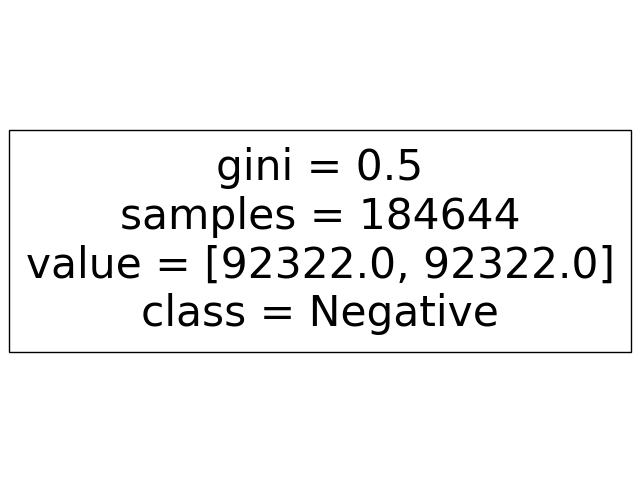

|--- class: 0

CPU times: user 321 ms, sys: 145 ms, total: 466 ms
Wall time: 491 ms


In [70]:
%%time

dt_best_precision = 0
dt_best_auc = 0
dt_best_accuracy = 0

# fitting the tree on X_train, y_train
dt,train_columns = fit_decision_tree(
                            X=X_train,
                            y=y_train,
                            params=dt_best_params)

# getting the predictions on VALIDATION, accuracy, precision and roc_auc
y_pred_valid = dt.predict(X_valid)
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
precision_valid = precision_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

# updating the best precision and best auc
if precision_valid >= dt_best_precision and auc_valid >= dt_best_auc and accuracy_valid >= dt_best_accuracy:
  dt_best_precision = round(precision_valid,2)
  dt_best_auc = round(auc_valid,2)
  dt_best_accuracy = round(accuracy_valid,2)
  print(f'best precision on Validation set is {dt_best_precision}')
  print('\n')
  print(f'best accuracy on Validation set is {dt_best_accuracy}')
  print('\n')
  print(f'best auc on Validation set is {dt_best_auc}')

# plot tree - long
plt.figure(figsize=(8,6))  # Set the size of the figure
plot_tree(dt,
           filled=True,
           feature_names=train_columns,
           class_names=['Negative', 'Positive'],
           max_depth=3)
plt.show()

# plot tree - short
tree_rules = export_text(dt, feature_names=list(X_train), max_depth=3)
print(tree_rules)

* fit both train and validation data with best decision tree classifier params

In [71]:
dt

DecisionTreeClassifier(ccp_alpha=0.0003801808385733083, class_weight='balanced',
                       max_depth=6, max_features='log2',
                       min_impurity_decrease=0.0009992299736659755,
                       min_samples_leaf=0.028298662067626795,
                       min_samples_split=0.19062990505054228,
                       min_weight_fraction_leaf=0.011818595750426864,
                       random_state=42)

In [72]:
%%time
dt, train_columns = fit_decision_tree(X=X_train_valid,
                           y=y_train_valid,
                           params=dt_best_params)

CPU times: user 228 ms, sys: 131 ms, total: 359 ms
Wall time: 360 ms


In [73]:
# Here's how you can get this information for your trained DecisionTreeClassifier:

# Get the number of nodes and leaves in the tree
n_nodes = dt.tree_.node_count
n_leaves = dt.get_n_leaves()

print(f"Number of nodes: {n_nodes}")
print(f"Number of leaves: {n_leaves}")

Number of nodes: 1
Number of leaves: 1


### Random Forest Classifier

* Hyperparameters tuning with Hyperopt

In [74]:
# define objective function
def objective(params):
    rf = RandomForestClassifier(**params)
    accuracy = cross_val_score(rf, X_train, y_train, cv=5).mean()
    return {"loss": -accuracy, "status": STATUS_OK}

In [75]:
# Hyperparameter space for RandomForestClassifier
space = {
    "n_estimators": hp.choice("n_estimators", range(100, 301, 50)),
    "max_depth": hp.choice("max_depth", range(3, 25)),
    "min_samples_split": hp.uniform("min_samples_split", 0.01, 0.2),
    "min_samples_leaf": hp.uniform("min_samples_leaf", 0.01, 0.1),
    "criterion": hp.choice("criterion", ["gini", "entropy", "log_loss"]),
    "min_weight_fraction_leaf": hp.uniform("min_weight_fraction_leaf", 0.0, 0.1),
    "max_features": hp.choice("max_features", ["sqrt", "log2"]),
    "min_impurity_decrease": hp.uniform("min_impurity_decrease", 0.0, 0.001),
    "class_weight": hp.choice("class_weight", ["balanced", "balanced_subsample"]),
    "ccp_alpha": hp.uniform("ccp_alpha", 0.0, 0.001),
    "random_state": 42,
    "oob_score": hp.choice("oob_score", [True, False]),
    "verbose": 0
}


In [76]:
%%time

# Run optimization
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)   # max eval can be changed to reduce running time
print(best)

100%|██████████| 20/20 [1:03:05<00:00, 189.29s/trial, best loss: -0.4514313168594679]
{'ccp_alpha': np.float64(0.0008406759868763677), 'class_weight': np.int64(1), 'criterion': np.int64(0), 'max_depth': np.int64(6), 'max_features': np.int64(0), 'min_impurity_decrease': np.float64(0.00023673609780967253), 'min_samples_leaf': np.float64(0.053015871945638934), 'min_samples_split': np.float64(0.05838770329894028), 'min_weight_fraction_leaf': np.float64(0.05200130898662299), 'n_estimators': np.int64(2), 'oob_score': np.int64(0)}
CPU times: user 1h 2s, sys: 2min 36s, total: 1h 2min 39s
Wall time: 1h 3min 5s


In [77]:
# Print the best hyperparameters
print("Best hyperparameters of hyperopt tuned Random Forest found:")

best_params = space_eval(space, best)
best_params = {k: v.item() if isinstance(v, (np.integer, np.floating)) else v for k, v in best_params.items()}

print(best_params)

Best hyperparameters of hyperopt tuned Random Forest found:
{'ccp_alpha': 0.0008406759868763677, 'class_weight': 'balanced_subsample', 'criterion': 'gini', 'max_depth': 9, 'max_features': 'sqrt', 'min_impurity_decrease': 0.00023673609780967253, 'min_samples_leaf': 0.053015871945638934, 'min_samples_split': 0.05838770329894028, 'min_weight_fraction_leaf': 0.05200130898662299, 'n_estimators': 200, 'oob_score': True, 'random_state': 42, 'verbose': 0}


In [78]:
#best_params

In [79]:
# Map Hyperopt indices to actual values
rf_best_params = {
    'ccp_alpha': best_params['ccp_alpha'],
    'class_weight': best_params['class_weight'],
    'criterion': best_params['criterion'],
    'max_depth': best_params['max_depth'],
    'max_features': best_params['max_features'],
    'min_impurity_decrease': best_params['min_impurity_decrease'],
    'min_samples_leaf': best_params['min_samples_leaf'],
    'min_samples_split': best_params['min_samples_split'],
    'min_weight_fraction_leaf': best_params['min_weight_fraction_leaf'],
    'n_estimators': best_params['n_estimators'],
    'oob_score': best_params['oob_score'],
    'random_state': best_params['random_state'],
    'verbose': best_params['verbose'],
}

In [80]:
# Estimation object/fit function (using dataframe of features X and what to predict y) with the best parameters
def fit_random_forest(X, y, params):
    rf = RandomForestClassifier(**params)
    rf.fit(X, y)
    return rf, X.columns

In [81]:
%%time

rf_best_precision = 0
rf_best_auc = 0
rf_best_accuracy = 0

# fitting the forest on X_train, y_train
rf,train_columns = fit_random_forest(
                            X=X_train,
                            y=y_train,
                            params=rf_best_params)

# getting the predictions on VALIDATION, accuracy, precision and roc_auc
y_pred_valid = rf.predict(X_valid)
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
precision_valid = precision_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

# updating the best precision and best auc
if precision_valid >= rf_best_precision and auc_valid >= rf_best_auc and accuracy_valid >= rf_best_accuracy:
  rf_best_precision = round(precision_valid,2)
  rf_best_auc = round(auc_valid,2)
  rf_best_accuracy = round(accuracy_valid,2)
  print(f'best precision on Validation set is {rf_best_precision}')
  print('\n')
  print(f'best accuracy on Validation set is {rf_best_accuracy}')
  print('\n')
  print(f'best auc on Validation set is {rf_best_auc}')

best precision on Validation set is 0.5


best accuracy on Validation set is 0.53


best auc on Validation set is 0.54
CPU times: user 54.2 s, sys: 3.19 s, total: 57.4 s
Wall time: 57.7 s


* fit both train and validation data with best random forest classifier params

In [82]:
rf

RandomForestClassifier(ccp_alpha=0.0008406759868763677,
                       class_weight='balanced_subsample', max_depth=9,
                       min_impurity_decrease=0.00023673609780967253,
                       min_samples_leaf=0.053015871945638934,
                       min_samples_split=0.05838770329894028,
                       min_weight_fraction_leaf=0.05200130898662299,
                       n_estimators=200, oob_score=True, random_state=42)

In [83]:
%%time
rf, train_columns = fit_random_forest(X=X_train_valid,
                           y=y_train_valid,
                           params=rf_best_params)

CPU times: user 1min 5s, sys: 3.8 s, total: 1min 9s
Wall time: 1min 9s


### XGBoost Classifier

* Hyperparameters tuning with Hyperopt

In [84]:
# define objective function
def objective(params):
    xgb1 = xgb.XGBClassifier(**params)
    accuracy = cross_val_score(xgb1, X_train, y_train, cv=5).mean()
    return {"loss": -accuracy, "status": STATUS_OK}

In [85]:
search_space = {
    "n_estimators": hp.choice("n_estimators", range(100, 501, 50)),
    "max_depth": hp.choice("max_depth", range(3, 11)),
    "learning_rate": hp.loguniform("learning_rate", np.log(0.005), np.log(0.3)),
    "subsample": hp.uniform("subsample", 0.01, 1.0),
    "colsample_bytree": hp.uniform("colsample_bytree", 0.01, 1.0),
    "gamma": hp.uniform("gamma", 0.01, 1),
    "reg_alpha": hp.uniform("reg_alpha", 0.01, 1.0),
    "reg_lambda": hp.uniform("reg_lambda", 0.01, 1.0),
    "objective": "binary:logistic",
    "min_child_weight": hp.loguniform("min_child_weight", np.log(1), np.log(50)),
    "eval_metric": "auc",
    "random_state": 42
}

In [86]:
%%time

# Run optimization
trials = Trials()
best = fmin(fn=objective, space=search_space, algo=tpe.suggest, max_evals=20, trials=trials)    # max eval can be changed to reduce running time
print(best)

100%|██████████| 20/20 [1:16:20<00:00, 229.03s/trial, best loss: -0.4567604662288631]
{'colsample_bytree': np.float64(0.49940025099516744), 'gamma': np.float64(0.8770610350651781), 'learning_rate': np.float64(0.012070944572937612), 'max_depth': np.int64(1), 'min_child_weight': np.float64(28.663297628995185), 'n_estimators': np.int64(8), 'reg_alpha': np.float64(0.9216391271153244), 'reg_lambda': np.float64(0.21318182259787025), 'subsample': np.float64(0.02804900056565391)}
CPU times: user 2h 14min 7s, sys: 27.4 s, total: 2h 14min 34s
Wall time: 1h 16min 20s


In [87]:
# Print the best hyperparameters
print("Best hyperparameters of hyperopt tuned XGBoost Classifier found:")

best_params = space_eval(search_space, best)
best_params = {k: v.item() if isinstance(v, (np.integer, np.floating)) else v for k, v in best_params.items()}

print(best_params)

Best hyperparameters of hyperopt tuned XGBoost Classifier found:
{'colsample_bytree': 0.49940025099516744, 'eval_metric': 'auc', 'gamma': 0.8770610350651781, 'learning_rate': 0.012070944572937612, 'max_depth': 4, 'min_child_weight': 28.663297628995185, 'n_estimators': 500, 'objective': 'binary:logistic', 'random_state': 42, 'reg_alpha': 0.9216391271153244, 'reg_lambda': 0.21318182259787025, 'subsample': 0.02804900056565391}


In [88]:
#best_params

In [89]:
# Map Hyperopt indices to actual values
xgb1_best_params = {
    'n_estimators': best_params['n_estimators'],
    'max_depth': best_params['max_depth'],
    'learning_rate': best_params['learning_rate'],
    'subsample': best_params['subsample'],
    'colsample_bytree': best_params['colsample_bytree'],
    'gamma': best_params['gamma'],
    'reg_alpha': best_params['reg_alpha'],
    'reg_lambda': best_params['reg_lambda'],
    'objective': 'binary:logistic',
    'min_child_weight': best_params['min_child_weight'],
    'eval_metric': 'auc',
    'random_state': 42
}

In [90]:
# Estimation object/fit function (using dataframe of features X and what to predict y) with the best parameters
def fit_xgbclassifier(X, y, params):
    xgb1 = xgb.XGBClassifier(**params)
    xgb1.fit(X, y)
    return xgb1, X.columns

In [91]:
%%time

xgb1_best_precision = 0
xgb1_best_auc = 0
xgb1_best_accuracy = 0

# fitting the forest on X_train, y_train
xgb1,train_columns = fit_xgbclassifier(
                            X=X_train,
                            y=y_train,
                            params=xgb1_best_params)

# getting the predictions on VALIDATION, accuracy, precision and roc_auc
y_pred_valid = xgb1.predict(X_valid)
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
precision_valid = precision_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

# updating the best precision and best auc
if precision_valid >= xgb1_best_precision and auc_valid >= xgb1_best_auc and accuracy_valid >= xgb1_best_accuracy:
  xgb1_best_precision = round(precision_valid,2)
  xgb1_best_auc = round(auc_valid,2)
  xgb1_best_accuracy = round(accuracy_valid,2)
  print(f'best precision on Validation set is {xgb1_best_precision}')
  print('\n')
  print(f'best accuracy on Validation set is {xgb1_best_accuracy}')
  print('\n')
  print(f'best auc on Validation set is {xgb1_best_auc}')

best precision on Validation set is 0.51


best accuracy on Validation set is 0.54


best auc on Validation set is 0.53
CPU times: user 1min 35s, sys: 145 ms, total: 1min 35s
Wall time: 54.1 s


* fit both train and validation data with best XGBoost classifier params

In [92]:
xgb1

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.49940025099516744, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='auc', feature_types=None, feature_weights=None,
              gamma=0.8770610350651781, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.012070944572937612,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=28.663297628995185, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=500,
              n_jobs=None, num_parallel_tree=None, ...)

In [93]:
%%time
xgb1, train_columns = fit_xgbclassifier(X=X_train_valid,
                           y=y_train_valid,
                           params=xgb1_best_params)

CPU times: user 1min 49s, sys: 132 ms, total: 1min 50s
Wall time: 1min 1s


### XGBoost Algorithm from XGBoost Native API
Hyperparameters tuning with Hyperopt

In [94]:
# DMatrix data structure to train xgboost faster
dtrain_valid = xgb.DMatrix(X_train_valid, label=y_train_valid)
dtrain = xgb.DMatrix(X_train, label=y_train)
dval = xgb.DMatrix(X_valid, label=y_valid)
dtest = xgb.DMatrix(X_test, label=y_test)

In [95]:
# Define the objective function
def objective(params):
    params["max_depth"] = int(params["max_depth"])
    dtrain = xgb.DMatrix(X_train, label=y_train)
    cv_results = xgb.cv(
        params,
        dtrain,
        num_boost_round=100,
        nfold=5,
        metrics="auc",
        early_stopping_rounds=10,
    )
    best_score = cv_results["test-auc-mean"].min()
    return {"loss": best_score, "status": STATUS_OK}

In [96]:
# Hyperparameter space for XGBoost
search_space = {
    "n_estimators": hp.choice("n_estimators", range(100, 501, 50)),
    "max_depth": hp.choice("max_depth", range(3, 11)),
    "learning_rate": hp.loguniform("learning_rate", np.log(0.005), np.log(0.3)),
    "subsample": hp.uniform("subsample", 0.01, 1.0),
    "colsample_bytree": hp.uniform("colsample_bytree", 0.01, 1.0),
    "gamma": hp.uniform("gamma", 0.01, 1),
    "reg_alpha": hp.uniform("reg_alpha", 0.01, 1.0),
    "reg_lambda": hp.uniform("reg_lambda", 0.01, 1.0),
    "objective": "binary:logistic",
    "min_child_weight": hp.loguniform("min_child_weight", np.log(1), np.log(50)),
    "eval_metric": "auc",
    "random_state": 42
}

In [97]:
%%time

# Run the optimization
trials = Trials()
best = fmin(
    fn=objective, space=search_space, algo=tpe.suggest, max_evals=20, trials=trials
)

100%|██████████| 20/20 [23:07<00:00, 69.35s/trial, best loss: 0.5194432758944382]
CPU times: user 37min 15s, sys: 1min 7s, total: 38min 23s
Wall time: 23min 7s


In [98]:
# Print the best hyperparameters
print("Best hyperparameters of hyperopt-tuned XGB found:")

best_params = space_eval(search_space, best)
best_params = {k: v.item() if isinstance(v, (np.integer, np.floating)) else v for k, v in best_params.items()}

print(best_params)

Best hyperparameters of hyperopt-tuned XGB found:
{'colsample_bytree': 0.1242506903780362, 'eval_metric': 'auc', 'gamma': 0.647283073967021, 'learning_rate': 0.005814403436486027, 'max_depth': 9, 'min_child_weight': 1.9411600583657513, 'n_estimators': 400, 'objective': 'binary:logistic', 'random_state': 42, 'reg_alpha': 0.2562057051069956, 'reg_lambda': 0.5316896321670922, 'subsample': 0.5874967513194647}


In [99]:
#best_params

In [100]:
# Map Hyperopt results to parameter space
xgb2_best_params = {
    "max_depth": int(best["max_depth"]),
    "learning_rate": best["learning_rate"],
    "reg_alpha": best["reg_alpha"],
    "reg_lambda": best["reg_lambda"],
    "subsample": best["subsample"],
    "colsample_bytree": best["colsample_bytree"],
    "gamma": best["gamma"],
    "min_child_weight": best["min_child_weight"],
    "eval_metric": "auc",
    "n_estimators": best["n_estimators"],
    "objective": "binary:logistic",
    "random_state": 42
}

In [101]:
# Estimation object/fit function using dtrain and dval with the best parameters
def fit_xgboost(dtrain, dval, params, num_boost_round, early_stopping_rounds, verbose_eval):
    watchlist = [(dtrain, "train"), (dval, "eval")]
    xgb2 = xgb.train(
        params=params,
        dtrain=dtrain,
        num_boost_round=num_boost_round,
        evals=watchlist,
        early_stopping_rounds=early_stopping_rounds,
        verbose_eval=verbose_eval
    )
    return xgb2

In [102]:
%%time

xgb2_best_precision = 0
xgb2_best_auc = 0
xgb2_best_accuracy = 0

# Train XGBoost model with the best parameters
xgb2 = fit_xgboost(
    dtrain=dtrain,
    dval=dval,
    params=xgb2_best_params,
    num_boost_round=1000,
    early_stopping_rounds=50,
    verbose_eval=50
)

# getting the predictions on VALIDATION, accuracy, precision and roc_auc
y_pred_valid = xgb2.predict(dval)
y_pred_valid = (y_pred_valid >= 0.5).astype(int)
accuracy_valid = accuracy_score(y_valid, y_pred_valid)
precision_valid = precision_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

# updating the best precision and best auc
if precision_valid >= xgb2_best_precision and auc_valid >= xgb2_best_auc and accuracy_valid >= xgb2_best_accuracy:
  xgb2_best_precision = round(precision_valid,2)
  xgb2_best_auc = round(auc_valid,2)
  xgb2_best_accuracy = round(accuracy_valid,2)
  print(f'best precision on Validation set is {xgb2_best_precision}')
  print('\n')
  print(f'best accuracy on Validation set is {xgb2_best_accuracy}')
  print('\n')
  print(f'best auc on Validation set is {xgb2_best_auc}')

[0]	train-auc:0.51646	eval-auc:0.51613
[50]	train-auc:0.57598	eval-auc:0.56158
[85]	train-auc:0.57881	eval-auc:0.56274
best precision on Validation set is 0.0


best accuracy on Validation set is 0.54


best auc on Validation set is 0.5
CPU times: user 27.8 s, sys: 93 ms, total: 27.9 s
Wall time: 16.6 s


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



* fit both train and validation data with best XGBoost-API params

In [103]:
%%time
xgb2 = fit_xgboost(
    dtrain=dtrain_valid,
    dval=dval,
    params=xgb2_best_params,
    num_boost_round=1000,
    early_stopping_rounds=50,
    verbose_eval=50
)

[0]	train-auc:0.51837	eval-auc:0.51892
[50]	train-auc:0.57483	eval-auc:0.57562
[100]	train-auc:0.57853	eval-auc:0.57960
[150]	train-auc:0.58176	eval-auc:0.58231
[200]	train-auc:0.58362	eval-auc:0.58433
[250]	train-auc:0.58595	eval-auc:0.58697
[300]	train-auc:0.58813	eval-auc:0.58935
[350]	train-auc:0.59039	eval-auc:0.59200
[400]	train-auc:0.59343	eval-auc:0.59543
[450]	train-auc:0.59587	eval-auc:0.59750
[500]	train-auc:0.59837	eval-auc:0.60010
[550]	train-auc:0.60110	eval-auc:0.60314
[600]	train-auc:0.60362	eval-auc:0.60556
[650]	train-auc:0.60597	eval-auc:0.60796
[700]	train-auc:0.60838	eval-auc:0.61058
[750]	train-auc:0.61070	eval-auc:0.61305
[800]	train-auc:0.61302	eval-auc:0.61508
[850]	train-auc:0.61515	eval-auc:0.61736
[900]	train-auc:0.61707	eval-auc:0.61948
[950]	train-auc:0.61928	eval-auc:0.62189
[999]	train-auc:0.62106	eval-auc:0.62372
CPU times: user 5min 47s, sys: 784 ms, total: 5min 48s
Wall time: 3min 18s


In [104]:
float(dt_best_accuracy), float(dt_best_precision), float(dt_best_auc)

(0.54, 0.0, 0.5)

In [105]:
float(rf_best_accuracy), float(rf_best_precision), float(rf_best_auc)

(0.53, 0.5, 0.54)

In [106]:
float(xgb1_best_accuracy), float(xgb1_best_precision), float(xgb1_best_auc)

(0.54, 0.51, 0.53)

In [107]:
float(xgb2_best_accuracy), float(xgb2_best_precision), float(xgb2_best_auc)

(0.54, 0.0, 0.5)

### Different rules to improve the Precision (varying Threshold)

* Predicting probabilities (predict_proba) and getting the distribution for probabilities.

In [108]:
# Unconditional probability of a positive growth
unc_prob = y_test.sum()/y_test.count()

print(f'Unconditional probability of a positive growth is {int(unc_prob*100)}%')

Unconditional probability of a positive growth is 46%


1. Decision Tree Probability Predicitons

In [109]:
# predicting probability
y_pred_test_dt = dt.predict_proba(X_test)[:,1]
y_pred_test_dt

array([0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5])

In [110]:
# Dataframe of predictions class
y_pred_test_dt_df = pd.DataFrame(y_pred_test_dt, columns=['Class_dt_probability'])

# sample of predictions
y_pred_test_dt_df.sample(5)

,Class_dt_probability
6245,0.5
22529,0.5
19309,0.5
35251,0.5
21072,0.5


In [111]:
# Statistical information of Class_dt
y_pred_test_dt_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Class_dt_probability,40019.0,0.5,1.858537e-13,0.5,0.5,0.5,0.5,0.5


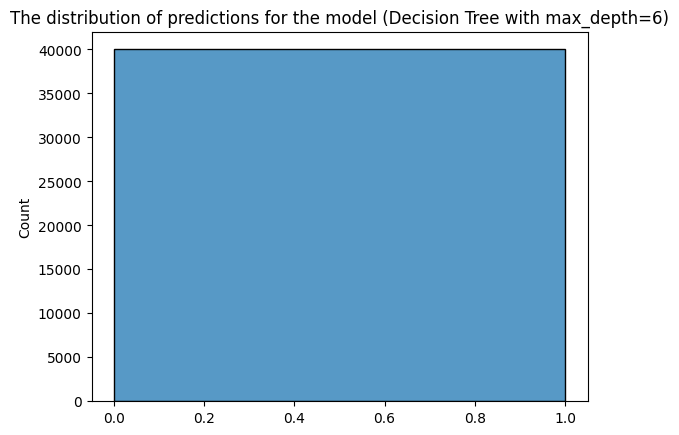

In [112]:
sns.histplot(y_pred_test_dt)

# Add a title
plt.title(f'The distribution of predictions for the model (Decision Tree with max_depth={dt.max_depth})')

# Show the plot
plt.show()

In [113]:
# tpr (True Positive Rate) vs. fpr (False Positive Rate) dataframe
# tp = True Positive
# tn = True Negative
# fp = False Positive
# fn = False Negative
# Decision Rule :  "y_pred>= Threshold"

# when only_even=True --> we'll have a step ==0.02 and leave only even records

def tpr_fpr_dataframe(y_true, y_pred, only_even=False):
    scores = []

    if only_even==False:
      thresholds = np.linspace(0, 1, 101) #[0, 0.01, 0.02, ...0.99,1.0]
    else:
      thresholds = np.linspace(0, 1, 51) #[0, 0.02, 0.04,  ...0.98,1.0]

    for t in thresholds:

        actual_positive = (y_true == 1)
        actual_negative = (y_true == 0)

        predict_positive = (y_pred >= t)
        predict_negative = (y_pred < t)

        tp = (predict_positive & actual_positive).sum()
        tn = (predict_negative & actual_negative).sum()

        fp = (predict_positive & actual_negative).sum()
        fn = (predict_negative & actual_positive).sum()

        if tp + fp > 0:
          precision = tp / (tp + fp)

        if tp + fn > 0:
          recall = tp / (tp + fn)

        if precision+recall > 0:
          f1_score = 2*precision*recall / (precision+recall)

        accuracy = (tp+tn) / (tp+tn+fp+fn)

        scores.append((t, tp, fp, fn, tn, precision, recall, accuracy, f1_score))

    columns = ['threshold', 'tp', 'fp', 'fn', 'tn','precision','recall', 'accuracy','f1_score']
    df_scores = pd.DataFrame(scores, columns=columns)

    df_scores['tpr'] = df_scores.tp / (df_scores.tp + df_scores.fn)
    df_scores['fpr'] = df_scores.fp / (df_scores.fp + df_scores.tn)

    return df_scores

In [114]:
dt_scores = tpr_fpr_dataframe(y_test,
                              y_pred_test_dt,
                              only_even=True)

# full df_scores
dt_scores

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
0,0.00,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
1,0.02,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
2,0.04,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
3,0.06,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
4,0.08,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
5,0.10,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
6,0.12,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
7,0.14,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
8,0.16,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
9,0.18,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0


In [115]:
# filtering dataframe on thresholds with precision and accuracy
dt_scores[(dt_scores.threshold>=0.00) & (dt_scores.threshold<=0.50)]

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
0,0.00,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
1,0.02,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
2,0.04,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
3,0.06,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
4,0.08,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
5,0.10,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
6,0.12,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
7,0.14,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
8,0.16,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0
9,0.18,18731,21288,0,0,0.468053,1.0,0.468053,0.637651,1.0,1.0


<Axes: title={'center': 'Precision vs. Recall for the Best Model (Decision Tree with max_depth=6)'}, xlabel='threshold'>

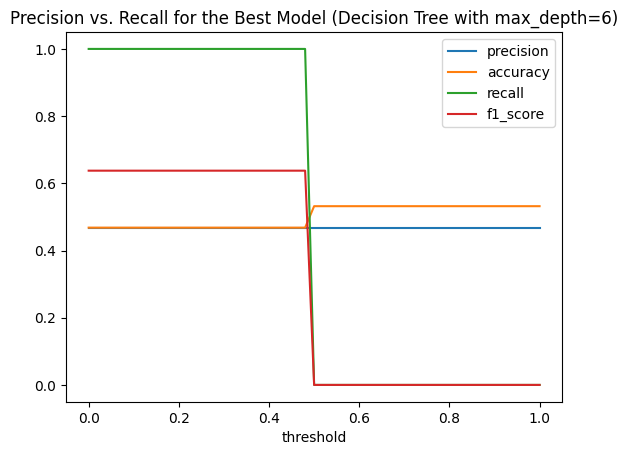

In [116]:
# Try to find high Precision score points

dt_scores.plot.line(x='threshold',
                    y=['precision', 'accuracy', 'recall', 'f1_score'],
                    title = f'Precision vs. Recall for the Best Model (Decision Tree with max_depth={dt.max_depth})')

2. Random Forest Probability Predictions

In [117]:
# predicting probability
y_pred_test_rf = rf.predict_proba(X_test)[:,1]
y_pred_test_rf

array([0.50307994, 0.50307994, 0.50307994, ..., 0.50069658, 0.49248017,
       0.48614954])

In [118]:
# Dataframe of predictions class
y_pred_test_rf_df = pd.DataFrame(y_pred_test_rf, columns=['Class_rf_probability'])

# sample of predictions
y_pred_test_rf_df.sample(5)

,Class_rf_probability
25879,0.508929
11804,0.499175
1243,0.503184
14178,0.507694
28051,0.489819


In [119]:
# Statistical information of Class_rf
y_pred_test_rf_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Class_rf_probability,40019.0,0.500293,0.011859,0.449115,0.498332,0.502608,0.509153,0.512771


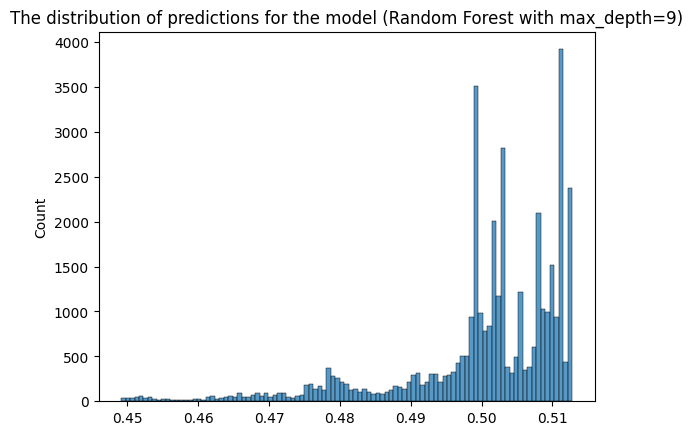

In [120]:
sns.histplot(y_pred_test_rf)

# Add a title
plt.title(f'The distribution of predictions for the model (Random Forest with max_depth={rf.max_depth})')

# Show the plot
plt.show()

In [121]:
rf_scores = tpr_fpr_dataframe(y_test,
                              y_pred_test_rf,
                              only_even=True)

# full df_scores
rf_scores

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
0,0.00,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
1,0.02,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
2,0.04,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
3,0.06,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
4,0.08,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
5,0.10,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
6,0.12,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
7,0.14,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
8,0.16,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
9,0.18,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000


In [122]:
# filtering dataframe on thresholds (precision & accuracy)
rf_scores[(rf_scores.threshold>=0.00) & (rf_scores.threshold<=0.5)]

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
0,0.00,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
1,0.02,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
2,0.04,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
3,0.06,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
4,0.08,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
5,0.10,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
6,0.12,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
7,0.14,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
8,0.16,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
9,0.18,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000


<Axes: title={'center': 'Precision vs. Recall for the Best Model (Random Forest with max_depth=9)'}, xlabel='threshold'>

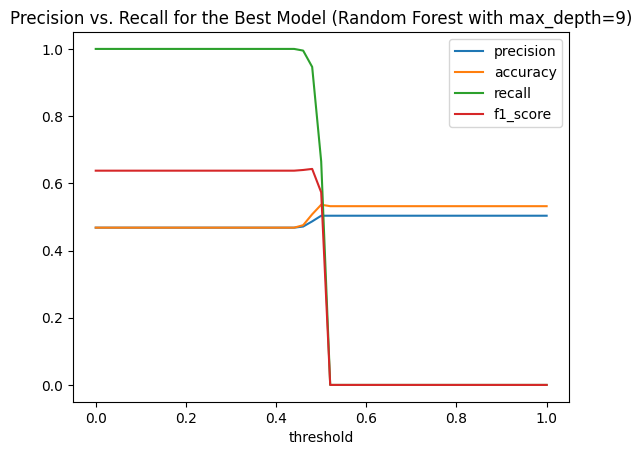

In [123]:
# Try to find high Precision score points

rf_scores.plot.line(x='threshold',
                    y=['precision', 'accuracy', 'recall', 'f1_score'],
                    title = f'Precision vs. Recall for the Best Model (Random Forest with max_depth={rf.max_depth})')

3. XGBoost Probability Predictions

In [124]:
# predicting probability
y_pred_test_xgb1 = xgb1.predict_proba(X_test)[:,1]
y_pred_test_xgb1

array([0.4674591 , 0.474811  , 0.47341302, ..., 0.49358305, 0.45615378,
       0.320304  ], dtype=float32)

In [125]:
# Dataframe of predictions class
y_pred_test_xgb1_df = pd.DataFrame(y_pred_test_xgb1, columns=['Class_xgb1_probability'])

# sample of predictions
y_pred_test_xgb1_df.sample(5)

,Class_xgb1_probability
39250,0.370009
5100,0.455143
25427,0.467872
21592,0.485316
8169,0.477002


In [126]:
# Statistical information of Class_xgb1
y_pred_test_xgb1_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Class_xgb1_probability,40019.0,0.463008,0.072222,0.141111,0.449224,0.477709,0.505002,0.588286


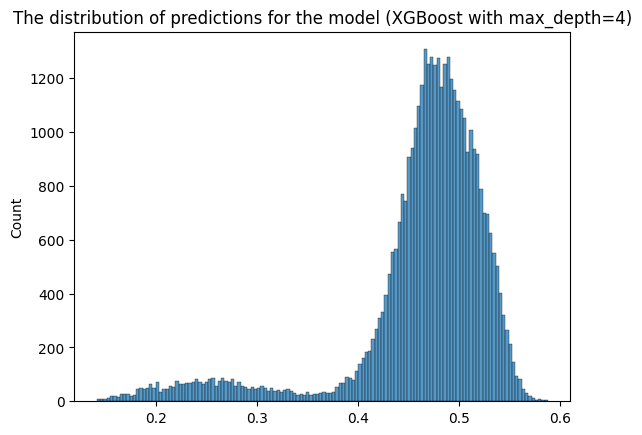

In [127]:
sns.histplot(y_pred_test_xgb1)

# Add a title
plt.title(f'The distribution of predictions for the model (XGBoost with max_depth={xgb1.max_depth})')

# Show the plot
plt.show()

In [128]:
xgb1_scores = tpr_fpr_dataframe(y_test,
                              y_pred_test_xgb1,
                              only_even=True)

# full df_scores
xgb1_scores

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
0,0.00,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
1,0.02,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
2,0.04,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
3,0.06,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
4,0.08,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
5,0.10,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
6,0.12,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
7,0.14,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
8,0.16,18717,21230,14,58,0.468546,0.999253,0.469152,0.637956,0.999253,0.997275
9,0.18,18692,21106,39,182,0.469672,0.997918,0.471626,0.638726,0.997918,0.991451


In [129]:
# filtering dataframe on thresholds (precision & accuracy)
xgb1_scores[(xgb1_scores.threshold>=0.00) & (xgb1_scores.threshold<=0.56)]

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
0,0.00,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
1,0.02,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
2,0.04,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
3,0.06,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
4,0.08,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
5,0.10,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
6,0.12,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
7,0.14,18731,21288,0,0,0.468053,1.000000,0.468053,0.637651,1.000000,1.000000
8,0.16,18717,21230,14,58,0.468546,0.999253,0.469152,0.637956,0.999253,0.997275
9,0.18,18692,21106,39,182,0.469672,0.997918,0.471626,0.638726,0.997918,0.991451


<Axes: title={'center': 'Precision vs. Recall for the Best Model (XGBoost with max_depth=4)'}, xlabel='threshold'>

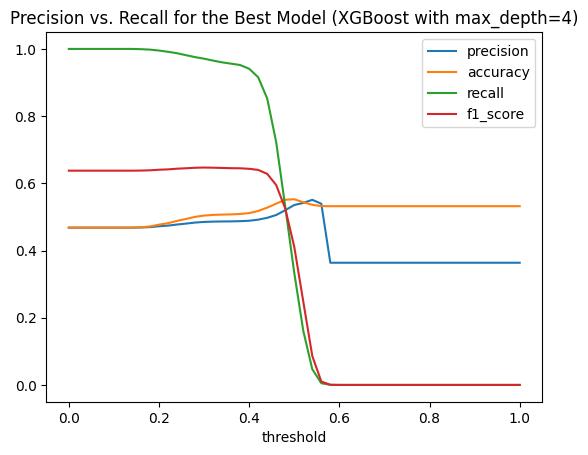

In [130]:
# High Precision score points

xgb1_scores.plot.line(x='threshold',
                    y=['precision', 'accuracy', 'recall', 'f1_score'],
                    title = f'Precision vs. Recall for the Best Model (XGBoost with max_depth={xgb1.max_depth})')

### Defining new columns with Predictions in new_df

In [131]:
# existing predictions
PREDICTIONS

['pred0_manual_strong_trend',
 'pred1_manual_prev_growth',
 'pred2_manual_bullish',
 'pred3_manual_bearish',
 'pred4_manual_momentum_up',
 'pred5_manual_momentum_down',
 'pred6_manual_trade_balance_us_mom']

* add Decision Tree (dt) to the dataset

In [132]:
dt

DecisionTreeClassifier(ccp_alpha=0.0003801808385733083, class_weight='balanced',
                       max_depth=6, max_features='log2',
                       min_impurity_decrease=0.0009992299736659755,
                       min_samples_leaf=0.028298662067626795,
                       min_samples_split=0.19062990505054228,
                       min_weight_fraction_leaf=0.011818595750426864,
                       random_state=42)

In [133]:
# Get probability of class 1 (positive class)
y_pred_all = dt.predict_proba(X_all)[:, 1]

# Add binary prediction using the optimal threhold for Decision Tree
new_df['pred7_dt'] = y_pred_all
new_df['pred8_dt_proba'] = (y_pred_all >= 0.5).astype(int)

new_df.sample(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,pred6_manual_trade_balance_us_mom,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_correct_pred3,is_correct_pred4,is_correct_pred5,is_correct_pred6,pred7_dt,pred8_dt_proba
3959,389.550995,389.709991,389.260010,389.450012,0.0,0.0,0.0,EURHUF=X,2024,May,...,0,1,1,1,1,1,1,1,0.5,0
8786,1.347750,1.349100,1.347300,1.348400,0.0,0.0,0.0,SGD=X,2025,February,...,1,1,0,0,0,0,0,1,0.5,0
7961,157.729004,157.845993,157.671005,157.820999,0.0,0.0,0.0,JPY=X,2024,December,...,0,1,1,0,0,0,0,0,0.5,0
9189,33.770000,33.770000,33.660000,33.680000,0.0,0.0,0.0,THB=X,2025,March,...,0,1,0,0,0,0,0,0,0.5,0
214,1.366500,1.366800,1.365910,1.366320,0.0,0.0,0.0,SGD=X,2023,September,...,0,0,0,0,0,0,0,0,0.5,0


* add Random Forest (rf) to the dataset

In [134]:
rf

RandomForestClassifier(ccp_alpha=0.0008406759868763677,
                       class_weight='balanced_subsample', max_depth=9,
                       min_impurity_decrease=0.00023673609780967253,
                       min_samples_leaf=0.053015871945638934,
                       min_samples_split=0.05838770329894028,
                       min_weight_fraction_leaf=0.05200130898662299,
                       n_estimators=200, oob_score=True, random_state=42)

In [135]:
# Get probability of class 1 (positive class)
y_pred_all = rf.predict_proba(X_all)[:, 1]

# Add binary predictions using the optimal threshold for Random Forest
new_df['pred9_rf'] = y_pred_all
new_df['pred10_rf_proba'] = (y_pred_all >= 0.5).astype(int)

new_df.sample(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,is_correct_pred1,is_correct_pred2,is_correct_pred3,is_correct_pred4,is_correct_pred5,is_correct_pred6,pred7_dt,pred8_dt_proba,pred9_rf,pred10_rf_proba
7711,20.225000,20.262609,20.223000,20.244780,0.0,0.0,0.0,MXN=X,2024,December,...,1,0,0,0,0,0,0.5,0,0.499026,0
3880,7.827880,7.828310,7.827610,7.827900,0.0,0.0,0.0,HKD=X,2024,April,...,0,0,0,0,1,0,0.5,0,0.494087,0
1923,0.862120,0.862840,0.861920,0.862650,0.0,0.0,0.0,EURGBP=X,2024,January,...,1,0,0,0,0,0,0.5,0,0.502821,1
1625,154.964005,155.028000,154.781006,154.820999,0.0,0.0,0.0,EURJPY=X,2023,December,...,0,0,0,1,0,1,0.5,0,0.508901,1
7495,16440.000000,16445.000000,16433.000000,16445.000000,0.0,0.0,0.0,IDR=X,2025,September,...,0,1,1,1,1,1,0.5,0,0.466342,0


* add XGBoost (xgb1) to the dataset

In [136]:
xgb1

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.49940025099516744, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='auc', feature_types=None, feature_weights=None,
              gamma=0.8770610350651781, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.012070944572937612,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=28.663297628995185, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=500,
              n_jobs=None, num_parallel_tree=None, ...)

In [137]:
# Get probability of class 1 (positive class) threshold >= 0.56
y_pred_all = xgb1.predict_proba(X_all)[:, 1]

# Add binary predictions using the optimal threshold for XGBoost
new_df['pred11_xgb1'] = y_pred_all
new_df['pred12_xgb1_proba'] = (y_pred_all >= 0.56).astype(int)

new_df.sample(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,is_correct_pred3,is_correct_pred4,is_correct_pred5,is_correct_pred6,pred7_dt,pred8_dt_proba,pred9_rf,pred10_rf_proba,pred11_xgb1,pred12_xgb1_proba
12042,0.93966,0.939850,0.93907,0.939610,0.0,0.0,0.0,EURCHF=X,2025,August,...,0,1,0,0,0.5,0,0.509412,1,0.496063,0
2591,161.36200,161.391998,161.20900,161.384003,0.0,0.0,0.0,EURJPY=X,2024,February,...,0,0,0,1,0.5,0,0.498875,0,0.478255,0
10751,1.56233,1.562400,1.56067,1.562140,0.0,0.0,0.0,EURCAD=X,2025,June,...,0,0,0,1,0.5,0,0.510065,1,0.490226,0
7024,7.76980,7.770000,7.76901,7.769110,0.0,0.0,0.0,HKD=X,2024,October,...,0,0,0,1,0.5,0,0.500535,1,0.523486,0
651,7.31650,7.318200,7.31650,7.317700,0.0,0.0,0.0,CNY=X,2023,October,...,1,1,1,1,0.5,0,0.479827,0,0.415827,0


In [138]:
(new_df['pred12_xgb1_proba'] == 1).value_counts()

,count
pred12_xgb1_proba,
False,263332
True,1819


In [139]:
# Get probability of class 1 (positive class) threshold >= 0.58
y_pred_all = xgb1.predict_proba(X_all)[:, 1]

# Add binary predictions using the optimal threshold for XGBoost
new_df['pred13_xgb2'] = y_pred_all
new_df['pred14_xgb2_proba'] = (y_pred_all >= 0.58).astype(int)

new_df.sample(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,is_correct_pred5,is_correct_pred6,pred7_dt,pred8_dt_proba,pred9_rf,pred10_rf_proba,pred11_xgb1,pred12_xgb1_proba,pred13_xgb2,pred14_xgb2_proba
5059,0.611995,0.612332,0.611958,0.612257,0.0,0.0,0.0,NZDUSD=X,2024,July,...,1,0,0.5,0,0.489844,0,0.466916,0,0.466916,0
7129,152.800995,152.955994,152.658997,152.766006,0.0,0.0,0.0,JPY=X,2024,November,...,1,1,0.5,0,0.511501,1,0.535436,0,0.535436,0
7231,0.658501,0.658501,0.657510,0.658198,0.0,0.0,0.0,AUDUSD=X,2024,November,...,0,0,0.5,0,0.512685,1,0.534701,0,0.534701,0
8259,192.291000,192.442001,192.054993,192.289001,0.0,0.0,0.0,GBPJPY=X,2025,January,...,0,0,0.5,0,0.495877,0,0.498446,0,0.498446,0
9474,194.692001,194.692001,194.098007,194.171005,0.0,0.0,0.0,GBPJPY=X,2025,March,...,1,1,0.5,0,0.511502,1,0.528002,0,0.528002,0


In [140]:
(new_df['pred14_xgb2_proba'] == 1).value_counts()

,count
pred14_xgb2_proba,
False,265042
True,109


In [141]:
# List of ALL current predictions
PREDICTIONS = [k for k in new_df.keys() if k.startswith('pred')]
PREDICTIONS

['pred0_manual_strong_trend',
 'pred1_manual_prev_growth',
 'pred2_manual_bullish',
 'pred3_manual_bearish',
 'pred4_manual_momentum_up',
 'pred5_manual_momentum_down',
 'pred6_manual_trade_balance_us_mom',
 'pred7_dt',
 'pred8_dt_proba',
 'pred9_rf',
 'pred10_rf_proba',
 'pred11_xgb1',
 'pred12_xgb1_proba',
 'pred13_xgb2',
 'pred14_xgb2_proba']

* Daily positive predictions for each model on test sets

In [142]:
# Unique trading days on Test
new_df[(new_df.split=='test')].Date.nunique()

79

In [143]:
# Positive predictions for Decision Tree
dt_daily_positive_count = pd.DataFrame(new_df[(new_df.split=='test')&(new_df.pred8_dt_proba==1)].groupby('Date')['pred8_dt_proba'].count())
dt_daily_positive_count

,pred8_dt_proba
Date,


In [144]:
# Positive predictions for Random Forest
rf_daily_positive_count = pd.DataFrame(new_df[(new_df.split=='test')&(new_df.pred10_rf_proba==1)].groupby('Date')['pred10_rf_proba'].count())
rf_daily_positive_count

,pred10_rf_proba
Date,
2025-05-26,303
2025-05-27,270
2025-05-28,313
2025-05-29,320
2025-05-30,291
...,...
2025-09-05,312
2025-09-08,315
2025-09-09,338


In [145]:
# Positive predictions for XGBoost 0.56 threshold
xgb1_daily_positive_count = pd.DataFrame(new_df[(new_df.split=='test')&(new_df.pred12_xgb1_proba==1)].groupby('Date')['pred12_xgb1_proba'].count())
xgb1_daily_positive_count

,pred12_xgb1_proba
Date,
2025-05-26,1
2025-05-27,1
2025-05-28,1
2025-05-29,10
2025-05-30,1
2025-06-04,5
2025-06-05,2
2025-06-10,7
2025-06-12,13


In [146]:
# Positive predictions for XGBoost 0.58 threshold
xgb2_daily_positive_count = pd.DataFrame(new_df[(new_df.split=='test')&(new_df.pred14_xgb2_proba==1)].groupby('Date')['pred14_xgb2_proba'].count())
xgb2_daily_positive_count

,pred14_xgb2_proba
Date,
2025-05-29,1
2025-06-10,1
2025-07-25,3
2025-09-08,6


### Agg. stats on ALL predictions

In [147]:
# let's review the Predictions:
PREDICTIONS, IS_CORRECT = get_predictions_correctness(new_df, to_predict='is_positive_growth_1h_future')

Prediction columns founded: ['pred0_manual_strong_trend', 'pred1_manual_prev_growth', 'pred2_manual_bullish', 'pred3_manual_bearish', 'pred4_manual_momentum_up', 'pred5_manual_momentum_down', 'pred6_manual_trade_balance_us_mom', 'pred7_dt', 'pred8_dt_proba', 'pred9_rf', 'pred10_rf_proba', 'pred11_xgb1', 'pred12_xgb1_proba', 'pred13_xgb2', 'pred14_xgb2_proba']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4', 'is_correct_pred5', 'is_correct_pred6', 'is_correct_pred7', 'is_correct_pred8', 'is_correct_pred9', 'is_correct_pred10', 'is_correct_pred11', 'is_correct_pred12', 'is_correct_pred13', 'is_correct_pred14']
Precision on TEST set for each prediction:


Prediction column:pred0_manual_strong_trend , is_correct_column: is_correct_pred0
is_correct_pred0
0    13697
1    12004
Name: count, dtype: int64
is_correct_pred0
0    0.532936
1    0.467064
Name: count, dtype: float64
---------
Prediction column:pred1_manua

In [148]:
# check dates of each Split data
new_df.groupby('split').Date.agg(['min','max'])

,min,max
split,,
test,2025-05-26,2025-09-11
train,2023-09-12,2025-02-03
validation,2025-02-04,2025-05-23


In [149]:
#PREDICTIONS

In [150]:
# all predictions on MODELS (not-manual predictions)
PREDICTIONS_ON_MODELS = [p for p in PREDICTIONS if int(p.split('_')[0].replace('pred', ''))>=7]
PREDICTIONS_ON_MODELS

['pred7_dt',
 'pred8_dt_proba',
 'pred9_rf',
 'pred10_rf_proba',
 'pred11_xgb1',
 'pred12_xgb1_proba',
 'pred13_xgb2',
 'pred14_xgb2_proba']

In [151]:
# all predictions on Models - correctness
IS_CORRECT_ON_MODELS = [p for p in IS_CORRECT if int(p.replace('is_correct_pred', ''))>=7]
IS_CORRECT_ON_MODELS

['is_correct_pred7',
 'is_correct_pred8',
 'is_correct_pred9',
 'is_correct_pred10',
 'is_correct_pred11',
 'is_correct_pred12',
 'is_correct_pred13',
 'is_correct_pred14']

In [152]:
# predictions with models
new_df.groupby('split')[PREDICTIONS_ON_MODELS].agg(['count','sum','mean']).T

split                            test          train    validation
pred7_dt          count  40019.000000  184644.000000  40488.000000
                  sum    20009.500000   92322.000000  20244.000000
                  mean       0.500000       0.500000      0.500000
pred8_dt_proba    count  40019.000000  184644.000000  40488.000000
                  sum        0.000000       0.000000      0.000000
                  mean       0.000000       0.000000      0.000000
pred9_rf          count  40019.000000  184644.000000  40488.000000
                  sum    20021.214052   92287.346177  20254.383294
                  mean       0.500293       0.499812      0.500256
pred10_rf_proba   count  40019.000000  184644.000000  40488.000000
                  sum    24747.000000  112588.000000  25119.000000
                  mean       0.618381       0.609757      0.620406
pred11_xgb1       count  40019.000000  184644.000000  40488.000000
                  sum    18529.121094   86000.789062  18734.166016
                  mean       0.463008       0.465765      0.462709
pred12_xgb1_proba count  40019.000000  184644.000000  40488.000000
                  sum      178.000000    1514.000000    127.000000
                  mean       0.004448       0.008200      0.003137
pred13_xgb2       count  40019.000000  184644.000000  40488.000000
                  sum    18529.121094   86000.789062  18734.166016
                  mean       0.463008       0.465765      0.462709
pred14_xgb2_proba count  40019.000000  184644.000000  40488.000000
                  sum       11.000000      93.000000      5.000000
                  mean       0.000275       0.000504      0.000123

In [153]:
# All predictions stats
new_df.groupby('split')[PREDICTIONS].agg(['count','sum','mean']).T

split                                            test          train  \
pred0_manual_strong_trend         count  40019.000000  184644.000000   
                                  sum    25701.000000  118256.000000   
                                  mean       0.642220       0.640454   
pred1_manual_prev_growth          count  40019.000000  184644.000000   
                                  sum    14475.000000   65655.000000   
                                  mean       0.361703       0.355576   
pred2_manual_bullish              count  40019.000000  184644.000000   
                                  sum      221.000000    1197.000000   
                                  mean       0.005522       0.006483   
pred3_manual_bearish              count  40019.000000  184644.000000   
                                  sum      215.000000     799.000000   
                                  mean       0.005372       0.004327   
pred4_manual_momentum_up          count  40019.000000  184644.000000   
                                  sum     4855.000000   21960.000000   
                                  mean       0.121317       0.118932   
pred5_manual_momentum_down        count  40019.000000  184644.000000   
                                  sum     4963.000000   20611.000000   
                                  mean       0.124016       0.111626   
pred6_manual_trade_balance_us_mom count  40019.000000  184644.000000   
                                  sum    10659.000000   65353.000000   
                                  mean       0.266348       0.353941   
pred7_dt                          count  40019.000000  184644.000000   
                                  sum    20009.500000   92322.000000   
                                  mean       0.500000       0.500000   
pred8_dt_proba                    count  40019.000000  184644.000000   
                                  sum        0.000000       0.000000   
                                  mean       0.000000       0.000000   
pred9_rf                          count  40019.000000  184644.000000   
                                  sum    20021.214052   92287.346177   
                                  mean       0.500293       0.499812   
pred10_rf_proba                   count  40019.000000  184644.000000   
                                  sum    24747.000000  112588.000000   
                                  mean       0.618381       0.609757   
pred11_xgb1                       count  40019.000000  184644.000000   
                                  sum    18529.121094   86000.789062   
                                  mean       0.463008       0.465765   
pred12_xgb1_proba                 count  40019.000000  184644.000000   
                                  sum      178.000000    1514.000000   
                                  mean       0.004448       0.008200   
pred13_xgb2                       count  40019.000000  184644.000000   
                                  sum    18529.121094   86000.789062   
                                  mean       0.463008       0.465765   
pred14_xgb2_proba                 count  40019.000000  184644.000000   
                                  sum       11.000000      93.000000   
                                  mean       0.000275       0.000504   

split                                      validation  
pred0_manual_strong_trend         count  40488.000000  
                                  sum    26651.000000  
                                  mean       0.658244  
pred1_manual_prev_growth          count  40488.000000  
                                  sum    14151.000000  
                                  mean       0.349511  
pred2_manual_bullish              count  40488.000000  
                                  sum      186.000000  
                                  mean       0.004594  
pred3_manual_bearish              count  40488.000000  
                                  sum      110.000000  
               

In [154]:
new_df.tail(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,pred13_xgb2,pred14_xgb2_proba,is_correct_pred7,is_correct_pred8,is_correct_pred9,is_correct_pred10,is_correct_pred11,is_correct_pred12,is_correct_pred13,is_correct_pred14
9749,85.040001,85.040001,84.690002,84.989998,0.0,0.0,0.0,RUB=X,2025,September,...,0.472650,0,0,1,0,0,0,1,0,1
9750,84.989998,84.989998,84.675003,84.989998,0.0,0.0,0.0,RUB=X,2025,September,...,0.410613,0,0,1,0,1,0,1,0,1
9751,84.989998,84.989998,84.675003,84.785004,0.0,0.0,0.0,RUB=X,2025,September,...,0.493583,0,0,0,0,1,0,0,0,0
9752,84.699997,84.835999,84.650002,84.810997,0.0,0.0,0.0,RUB=X,2025,September,...,0.456154,0,0,1,0,1,0,1,0,1
9753,84.760002,84.760002,84.760002,84.760002,0.0,0.0,0.0,RUB=X,2025,September,...,0.320304,0,0,1,0,1,0,1,0,1


* save current dataframe

In [155]:
date = new_df.Date.max()
date_str = date.strftime('%Y_%m_%d')
print(date_str)

2025_09_11


In [156]:
new_df.to_parquet(f'forex_df_models_{date_str}.parquet.brotli',
              compression='brotli')